Dataset Selection:

For this assignment, we'll utilize the widely recognized Mushroom Datase

t
Task 1: Exploratory Data Analysis (ED
A)
1.	Load the Mushroom dataset and perform fundamental data explorati
   o3.
2.	Utilize histograms, box plots, or density plots to understand feature distributi
   o5s.
3.	Investigate feature correlations to discern relationships within the data.


Task 3: Data Visualization
1.	Employ scatter plots, pair plots, or relevant visualizations to comprehend feature distributions and relationships.
2.	Visualize class distributions to gauge dataset balance or imbalancecation tasks.



Task 4: SVM Implementation
1.	Implement a basic SVM classifier using Python libraries like scikit-learn.
2.	Train the SVM model on the training data.
3.	Evaluate model performance on the testing data using appropriate metrics (e.g., accuracy, precision, recall, F1-score).



Task 5: Visualization of SVM Results
1.	Visualize classification results on the testing data.
Task 6: Parameter Tuning and Optimization
1.	Experiment with different SVM hyperparameters (e.g., kernel type, regularization parameter) to optimize performance.
Task 7: Comparison and Analysis
1.	Compare SVM performance with various kernels (e.g., linear, polynomial, radial basis function).
2.	Analyze SVM strengths and weaknesses for the Mushroom dataset based on EDA and visualization results.
3.	Discuss practical implications of SVM in real-world classification tasks.

Task 6: Parameter Tuning and Optimization
1.	Experiment with different SVM hyperparameters (e.g., kernel type, regularization parameter) to optimize performance.
Task 7: Comparison and Analysis
1.	Compare SVM performance with various kernels (e.g., linear, polynomial, radial basis function).
2.	Analyze SVM strengths and weaknesses for the Mushroom dataset based on EDA and visualization results.
3.	Discuss practical implications of SVM in real-world classification tasks.

Task 7: Comparison and Analysis
1.	Compare SVM performance with various kernels (e.g., linear, polynomial, radial basis function).
2.	Analyze SVM strengths and weaknesses for the Mushroom dataset based on EDA and visualization results.
3.	Discuss practical implications of SVM in real-world classification tasks.

In [295]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score
from sklearn.decomposition import PCA

In [297]:
df = pd.read_csv('mushroom.csv')
df

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,...,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
1,1037,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,...,universal,brown,two,sheathing,brown,numerous,waste,edible,3.952715,19.068319
2,309,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,...,universal,yellow,two,sheathing,purple,abundant,waste,poisonous,9.054265,7.205884
3,282,bell,scaly,pink,yes,fishy,notched,close,broad,orange,...,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous,5.226499,20.932692
4,820,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,...,universal,white,none,none,yellow,clustered,urban,poisonous,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,863,sunken,scaly,brown,yes,foul,attached,crowded,narrow,chocolate,...,partial,orange,one,flaring,purple,abundant,leaves,poisonous,5.877891,17.464145
1996,1160,sunken,scaly,purple,yes,musty,attached,distant,narrow,red,...,partial,white,one,zone,yellow,numerous,waste,poisonous,6.500840,13.501957
1997,265,convex,grooves,green,yes,fishy,notched,close,narrow,pink,...,partial,brown,two,evanescent,yellow,abundant,woods,poisonous,13.558064,11.270020
1998,411,bell,smooth,white,no,pungent,free,close,narrow,orange,...,universal,yellow,one,cobwebby,brown,solitary,woods,poisonous,11.092703,8.423199


In [299]:
le = LabelEncoder()
for col in df.columns:
    df[col] = le.fit_transform(df[col]).astype(int)

In [301]:
df

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,889,4,2,7,0,1,1,2,0,7,...,0,0,2,6,3,1,5,1,916,190
1,786,4,0,6,0,1,3,1,1,3,...,1,0,2,6,1,2,5,0,128,750
2,246,3,1,5,1,4,1,1,0,8,...,1,3,2,6,6,0,5,1,537,281
3,221,0,2,4,1,3,3,0,0,6,...,0,3,2,0,4,1,0,1,234,829
4,630,3,3,8,1,5,2,1,1,6,...,1,2,0,4,8,1,4,1,895,484
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,656,4,2,0,1,4,0,1,1,3,...,0,1,1,2,6,0,1,1,283,680
1996,885,4,2,5,1,5,0,2,1,9,...,0,2,1,7,8,2,5,1,335,521
1997,205,2,1,3,1,3,3,0,1,7,...,0,0,2,1,8,0,6,1,859,438
1998,329,0,3,7,0,7,2,0,1,6,...,1,3,1,0,1,5,6,1,679,320


In [303]:
df.describe()

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,...,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000
mean,481.087000,2.052500,1.556000,3.862000,0.511500,3.988500,1.561500,1.00650,0.503500,5.348000,...,0.5050,1.455500,0.990500,3.562000,3.905500,2.458000,3.070000,0.700000,478.79400,476.150500
std,284.172024,1.435888,1.114668,2.626672,0.499993,2.542361,1.126433,0.81902,0.500113,3.388752,...,0.5001,1.117875,0.809776,2.294295,2.619351,1.732263,1.971559,0.458372,281.44026,284.323836
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
25%,228.000000,1.000000,1.000000,2.000000,0.000000,2.000000,1.000000,0.00000,0.000000,2.000000,...,0.0000,0.000000,0.000000,2.000000,1.000000,1.000000,1.000000,0.000000,238.00000,227.750000
50%,479.000000,2.000000,2.000000,4.000000,1.000000,4.000000,2.000000,1.00000,1.000000,5.000000,...,1.0000,2.000000,1.000000,4.000000,4.000000,2.000000,3.000000,1.000000,478.50000,462.500000
75%,729.250000,3.000000,3.000000,6.000000,1.000000,6.000000,3.000000,2.00000,1.000000,8.000000,...,1.0000,2.000000,2.000000,6.000000,6.000000,4.000000,5.000000,1.000000,729.25000,734.250000
max,975.000000,4.000000,3.000000,8.000000,1.000000,8.000000,3.000000,2.00000,1.000000,11.000000,...,1.0000,3.000000,2.000000,7.000000,8.000000,5.000000,6.000000,1.000000,972.00000,975.000000


In [305]:
df.info()        # no missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   Unnamed: 0                2000 non-null   int32
 1   cap_shape                 2000 non-null   int32
 2   cap_surface               2000 non-null   int32
 3   cap_color                 2000 non-null   int32
 4   bruises                   2000 non-null   int32
 5   odor                      2000 non-null   int32
 6   gill_attachment           2000 non-null   int32
 7   gill_spacing              2000 non-null   int32
 8   gill_size                 2000 non-null   int32
 9   gill_color                2000 non-null   int32
 10  stalk_shape               2000 non-null   int32
 11  stalk_root                2000 non-null   int32
 12  stalk_surface_above_ring  2000 non-null   int32
 13  stalk_surface_below_ring  2000 non-null   int32
 14  stalk_color_above_ring    2000 non-null 

In [443]:
df.duplicated().sum()

1024

In [453]:
df = df.drop_duplicates()  # all duplicate rows are dropped

In [451]:
df.duplicated().sum()

0

In [457]:
df.isna().sum()  # no missing values

Unnamed: 0                  0
cap_shape                   0
cap_surface                 0
cap_color                   0
bruises                     0
odor                        0
gill_attachment             0
gill_spacing                0
gill_size                   0
gill_color                  0
stalk_shape                 0
stalk_root                  0
stalk_surface_above_ring    0
stalk_surface_below_ring    0
stalk_color_above_ring      0
stalk_color_below_ring      0
veil_type                   0
veil_color                  0
ring_number                 0
ring_type                   0
spore_print_color           0
population                  0
habitat                     0
class                       0
stalk_height                0
cap_diameter                0
dtype: int64

In [307]:
df['class'].value_counts()

class
1    1400
0     600
Name: count, dtype: int64

In [429]:
df['population'].value_counts()

population
0    360
1    340
4    335
5    332
2    323
3    310
Name: count, dtype: int64

In [431]:
df['odor'].value_counts()

odor
4    274
1    242
5    239
3    228
8    226
7    212
0    203
2    197
6    179
Name: count, dtype: int64

In [433]:
df['habitat'].value_counts()

habitat
4    316
6    295
2    294
1    293
5    280
3    275
0    247
Name: count, dtype: int64

In [439]:
df['bruises'].value_counts()

bruises
1    1023
0     977
Name: count, dtype: int64

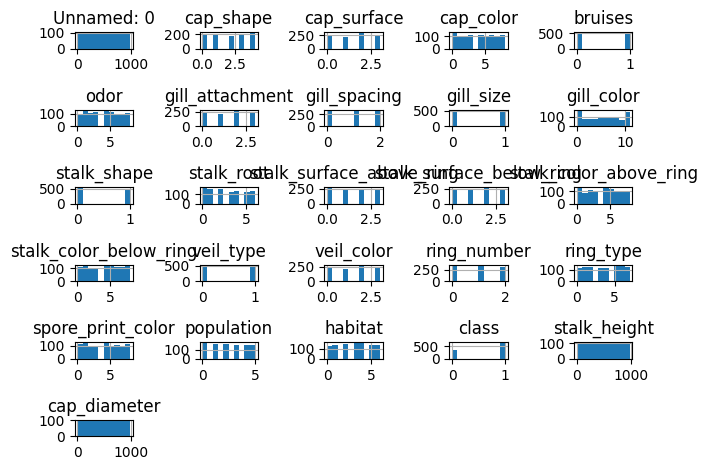

In [463]:
df.hist()
plt.tight_layout()
plt.show()

<Axes: >

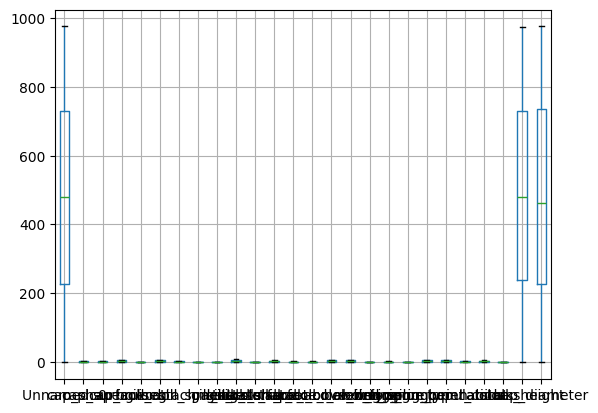

In [441]:
df.boxplot()   # outliers are not present 

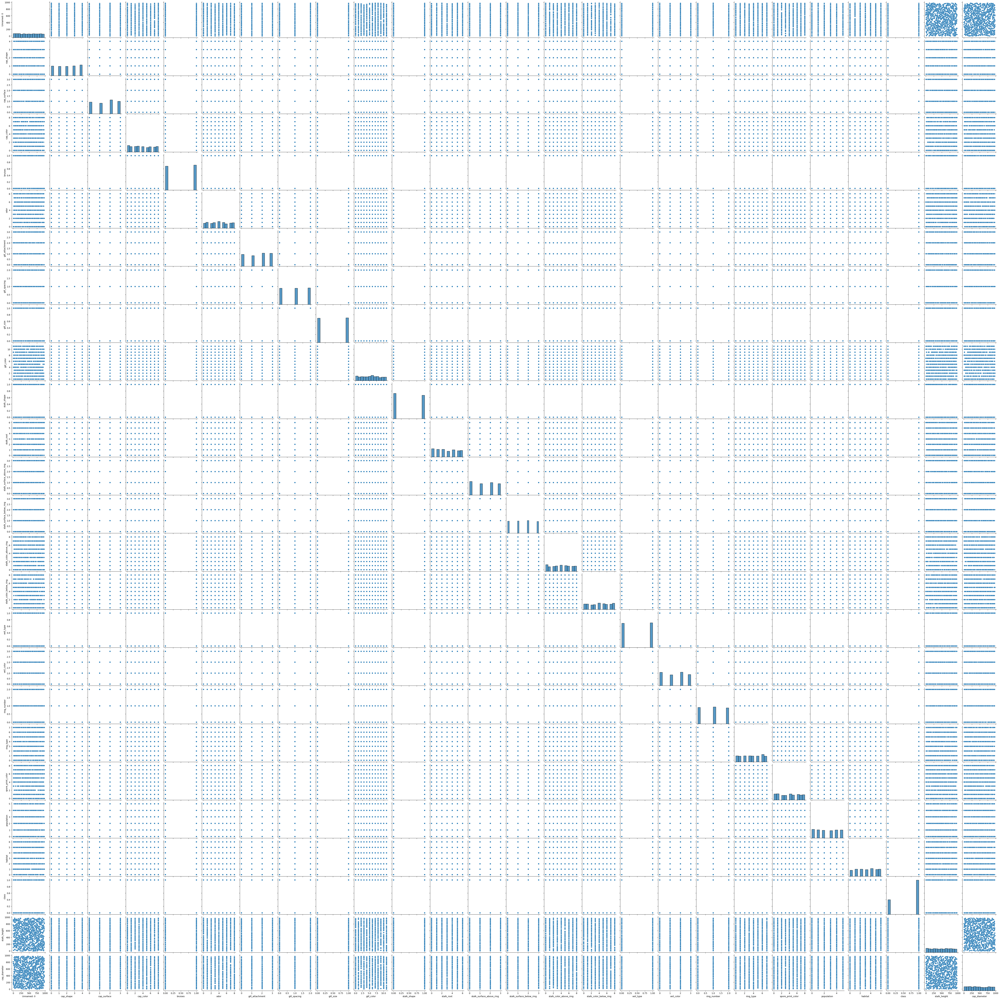

In [250]:
sns.pairplot(df)

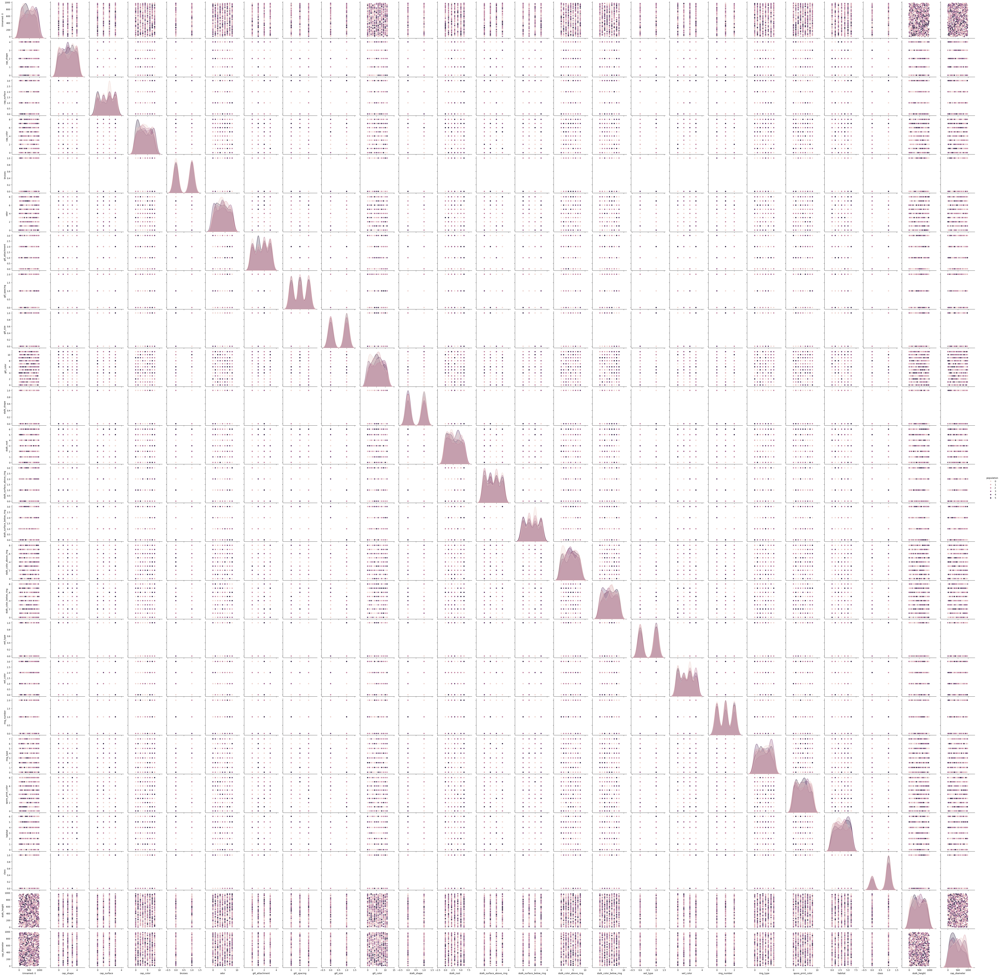

In [234]:
sns.pairplot(df,hue = 'population')

In [ ]:
# Summary statistics for numerical features
summary_stats = df.describe()

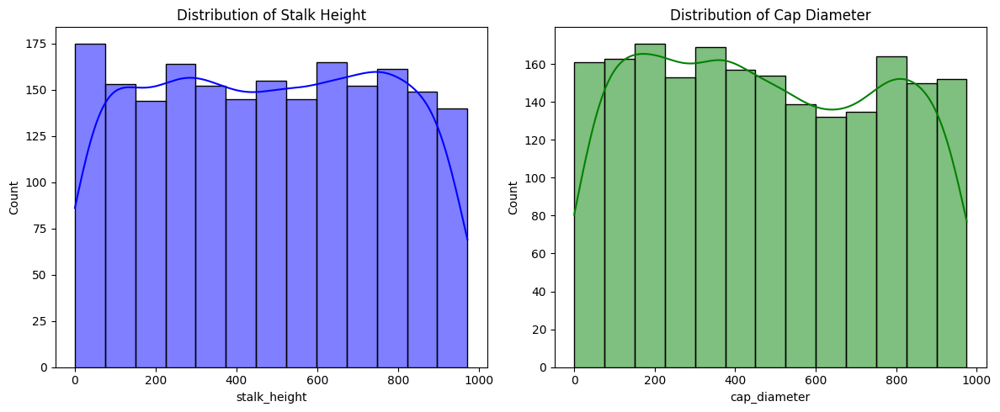

(None,
         Unnamed: 0    cap_shape  cap_surface    cap_color      bruises  \
 count  2000.000000  2000.000000  2000.000000  2000.000000  2000.000000   
 mean    481.087000     2.052500     1.556000     3.862000     0.511500   
 std     284.172024     1.435888     1.114668     2.626672     0.499993   
 min       0.000000     0.000000     0.000000     0.000000     0.000000   
 25%     228.000000     1.000000     1.000000     2.000000     0.000000   
 50%     479.000000     2.000000     2.000000     4.000000     1.000000   
 75%     729.250000     3.000000     3.000000     6.000000     1.000000   
 max     975.000000     4.000000     3.000000     8.000000     1.000000   
 
               odor  gill_attachment  gill_spacing    gill_size   gill_color  \
 count  2000.000000      2000.000000    2000.00000  2000.000000  2000.000000   
 mean      3.988500         1.561500       1.00650     0.503500     5.348000   
 std       2.542361         1.126433       0.81902     0.500113     3.388752

In [370]:
# Visualize the distribution of the numerical features
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
sns.histplot(df['stalk_height'], kde=True, ax=axs[0], color='blue')
axs[0].set_title('Distribution of Stalk Height')

sns.histplot(df['cap_diameter'], kde=True, ax=axs[1], color='green')
axs[1].set_title('Distribution of Cap Diameter')

plt.tight_layout()
plt.show(), summary_stats

In [313]:
# Split the data into features and target
X = df.drop(columns=['class'])
y = df['class']

In [315]:
X

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,stalk_height,cap_diameter
0,889,4,2,7,0,1,1,2,0,7,...,8,0,0,2,6,3,1,5,916,190
1,786,4,0,6,0,1,3,1,1,3,...,0,1,0,2,6,1,2,5,128,750
2,246,3,1,5,1,4,1,1,0,8,...,3,1,3,2,6,6,0,5,537,281
3,221,0,2,4,1,3,3,0,0,6,...,5,0,3,2,0,4,1,0,234,829
4,630,3,3,8,1,5,2,1,1,6,...,7,1,2,0,4,8,1,4,895,484
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,656,4,2,0,1,4,0,1,1,3,...,4,0,1,1,2,6,0,1,283,680
1996,885,4,2,5,1,5,0,2,1,9,...,4,0,2,1,7,8,2,5,335,521
1997,205,2,1,3,1,3,3,0,1,7,...,6,0,0,2,1,8,0,6,859,438
1998,329,0,3,7,0,7,2,0,1,6,...,5,1,3,1,0,1,5,6,679,320


In [317]:
y

0       1
1       0
2       1
3       1
4       1
       ..
1995    1
1996    1
1997    1
1998    1
1999    1
Name: class, Length: 2000, dtype: int32

In [319]:
# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [321]:
X_train

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,stalk_height,cap_diameter
836,685,2,2,0,0,5,0,0,1,10,...,2,1,3,0,5,7,4,4,3,645
575,72,0,3,6,0,0,1,2,0,9,...,4,1,3,2,0,0,2,3,334,244
557,529,0,1,4,1,3,2,1,1,4,...,4,0,3,2,2,1,1,3,333,87
1235,23,0,2,4,1,7,0,1,0,2,...,1,1,3,1,1,4,0,0,920,527
1360,10,4,1,5,0,0,2,2,0,9,...,5,1,3,2,1,1,1,0,220,247
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,480,4,2,8,0,1,3,0,0,8,...,4,0,0,0,6,2,3,6,672,515
1294,951,1,1,6,1,4,3,2,1,8,...,8,0,0,0,5,2,3,0,28,337
860,2,3,3,0,0,4,0,2,0,6,...,4,0,3,2,0,3,4,5,101,371
1459,839,4,1,8,0,1,1,1,0,4,...,7,0,2,0,5,6,4,5,304,869


In [323]:
X_test

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,stalk_height,cap_diameter
1860,56,4,3,6,0,1,1,1,0,6,...,1,0,2,1,6,7,1,0,221,383
353,796,3,3,0,1,1,1,0,1,6,...,0,1,3,0,5,6,4,3,860,133
1333,779,3,1,4,1,2,2,0,0,11,...,6,0,0,1,5,0,3,6,873,338
905,51,3,0,1,1,7,0,2,1,1,...,4,0,2,0,5,7,5,3,332,286
1289,62,3,2,6,1,5,2,2,0,3,...,8,1,2,2,3,0,2,3,629,528
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148,648,2,0,6,1,1,2,2,0,9,...,8,1,2,1,3,7,2,3,948,436
1554,375,3,0,7,1,5,3,1,0,0,...,5,0,0,1,2,5,5,5,10,681
1956,47,4,0,8,0,3,1,2,0,5,...,6,1,3,1,0,2,1,5,406,252
925,763,0,3,2,0,1,2,2,1,7,...,1,1,0,0,4,4,4,1,600,280


In [325]:
y_train

836     0
575     1
557     1
1235    1
1360    1
       ..
1130    0
1294    1
860     1
1459    1
1126    0
Name: class, Length: 1400, dtype: int32

In [327]:
y_test

1860    1
353     1
1333    0
905     1
1289    0
       ..
148     0
1554    1
1956    1
925     1
942     1
Name: class, Length: 600, dtype: int32

In [329]:
# Check the shape of the resulting datasets
X_train.shape, X_test.shape, y_train.shape, y_test.shape


((1400, 25), (600, 25), (1400,), (600,))

In [331]:
# Initialize and train the SVM model
svm_model = SVC(kernel='linear', random_state=42)


In [333]:
svm_model.fit(X_train, y_train)

SVC(kernel='linear', random_state=42)

In [334]:
# Predict on the test set
y_pred = svm_model.predict(X_test)

In [337]:
y_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [339]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

C:\Users\shubham\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\shubham\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\shubham\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitaliz

In [341]:
accuracy, classification_rep

(0.6916666666666667,
 '              precision    recall  f1-score   support\n\n           0       0.00      0.00      0.00       185\n           1       0.69      1.00      0.82       415\n\n    accuracy                           0.69       600\n   macro avg       0.35      0.50      0.41       600\nweighted avg       0.48      0.69      0.57       600\n')

In [343]:
# Visualization of the SVM results, like plotting the decision boundaries (only feasible in 2D)
from sklearn.decomposition import PCA

In [419]:
# Reduce the dimensions for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_test)

In [427]:
X_pca

array([[-430.13613693,  265.85287776],
       [ 412.55079861,   16.92853305],
       [ 457.07884248,   -7.58163521],
       ...,
       [-300.38995744,  394.14756942],
       [ 201.81754522, -116.86574716],
       [-114.47055552, -234.07543847]])

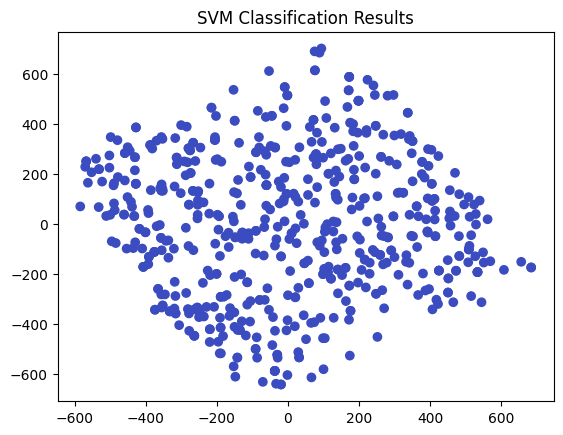

In [421]:
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_pred, cmap='coolwarm')
plt.title('SVM Classification Results')
plt.show()

In [351]:
# Experiment with different kernels and hyperparameters
svm_model_rbf = SVC(kernel='rbf', C=1, gamma=0.1, random_state=42)
svm_model_rbf.fit(X_train, y_train)
y_pred_rbf = svm_model_rbf.predict(X_test)

In [353]:
accuracy_rbf = accuracy_score(y_test, y_pred_rbf)
classification_rep_rbf = classification_report(y_test, y_pred_rbf)

In [355]:
print(f"RBF Kernel Accuracy: {accuracy_rbf}")
print(classification_rep_rbf)


RBF Kernel Accuracy: 0.8816666666666667
              precision    recall  f1-score   support

           0       1.00      0.62      0.76       185
           1       0.85      1.00      0.92       415

    accuracy                           0.88       600
   macro avg       0.93      0.81      0.84       600
weighted avg       0.90      0.88      0.87       600



In [357]:
# Initialize SVM models with different kernels
kernels = ['linear', 'poly', 'rbf']
results = {}

In [359]:
for kernel in kernels:
    # Initialize the model
    svm_model = SVC(kernel=kernel, random_state=42)
    # Train the model
    svm_model.fit(X_train, y_train)
    # Predict on the test set
    y_pred = svm_model.predict(X_test)
    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, output_dict=True)
    results[kernel] = {'accuracy': accuracy, 'report': report}


C:\Users\shubham\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\shubham\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\shubham\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitaliz

In [361]:
# Display the results
for kernel, metrics in results.items():
    print(f"\nKernel: {kernel}")
    print(f"Accuracy: {metrics['accuracy']}")
    print(f"Classification Report: \n{classification_report(y_test, svm_model.predict(X_test))}")



Kernel: linear
Accuracy: 0.6916666666666667
Classification Report: 
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       185
           1       0.69      1.00      0.82       415

    accuracy                           0.69       600
   macro avg       0.35      0.50      0.41       600
weighted avg       0.48      0.69      0.57       600


Kernel: poly
Accuracy: 0.6916666666666667


C:\Users\shubham\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\shubham\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\shubham\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitaliz

Classification Report: 
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       185
           1       0.69      1.00      0.82       415

    accuracy                           0.69       600
   macro avg       0.35      0.50      0.41       600
weighted avg       0.48      0.69      0.57       600


Kernel: rbf
Accuracy: 0.6916666666666667
Classification Report: 
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       185
           1       0.69      1.00      0.82       415

    accuracy                           0.69       600
   macro avg       0.35      0.50      0.41       600
weighted avg       0.48      0.69      0.57       600



C:\Users\shubham\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\shubham\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\shubham\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitaliz

2.	Analyze SVM strengths and weaknesses for the Mushroom dataset based on EDA and visualization results

Strengths of SVM for the Mushroom Dataset:

Effective for High-Dimensional Data:
The Mushroom dataset has many features, making it a high-dimensional problem. SVMs excel in handling high-dimensional data without overfitting.
Non-Linear Separability:
While not immediately apparent in simple visualizations, the underlying decision boundaries might be complex. SVMs, especially with kernel tricks, can effectively handle non-linear separations.
Robust to Outliers:
SVMs are relatively robust to outliers, as they focus on support vectors, which are data points closest to the decision boundary.
Weaknesses of SVM for the Mushroom Dataset:

Computational Cost:
For large datasets, training SVMs can be computationally expensive, especially with kernel methods like RBF.
Sensitivity to Hyperparameters:
The performance of SVMs is highly sensitive to hyperparameters like C (regularization parameter) and the kernel type. Careful tuning is required to achieve optimal results.
Less Interpretable:
Unlike decision trees, SVMs can be less interpretable, making it difficult to understand the decision-making process.
Specific to the Mushroom Dataset:

The Mushroom dataset is relatively small and well-defined, making it suitable for SVM.
The categorical nature of the features can be easily handled by techniques like one-hot encoding.
The clear separation between edible and poisonous mushrooms suggests that SVM can achieve high accuracy.

3.	Discuss practical implications of SVM in real-world classification tasks.

SVM is a powerful and versatile algorithm that has found applications in a wide range of real-world classification tasks. Here are some of its practical implications:

1. Image Classification:

Face Recognition: SVMs can be used to accurately identify individuals from images of their faces.
Object Detection: SVMs can be employed to detect objects within images, such as cars, pedestrians, or specific products.

2. Text Classification:

Sentiment Analysis: SVMs can classify text documents as positive, negative, or neutral.
Spam Detection: SVMs can be used to filter spam emails.
Document Categorization: SVMs can categorize documents into different topics or categories.

3. Medical Diagnosis:

Disease Diagnosis: SVMs can be used to diagnose diseases based on medical data, such as tumor classification or heart disease prediction.

4. Financial Applications:

Fraud Detection: SVMs can identify fraudulent transactions by analyzing patterns in financial data.
Credit Scoring: SVMs can be used to assess creditworthiness of individuals.

5. Bioinformatics:

Protein Structure Prediction: SVMs can predict the 3D structure of proteins.
Gene Classification: SVMs can classify genes based on their sequence and functional properties.
Key Considerations for Real-World Applications:

Feature Engineering: Effective feature engineering is crucial for SVM performance.
Hyperparameter Tuning: Tuning hyperparameters like C and the kernel type is essential to optimize the model.
Computational Cost: SVMs can be computationally expensive for large datasets, especially with kernel methods.
Interpretability: While SVMs are powerful, they can be less interpretable compared to other models like decision trees.